**Per Wikipedia:**

*Grantland was a sports and pop-culture blog owned and operated by ESPN. The blog was started in 2011 by veteran writer and sports journalist Bill Simmons, who remained as editor-in-chief until May 2015. 
On October 30, 2015, ESPN announced that it was ending the publication of Grantland.*

*Grantland was known for its long-form journalism and award-winning writing. Its sports journalism pieces often had a strong focus on sports analytics and data analysis, referencing and pulling data from sites like Football Outsiders, Baseball Prospectus, Synergy, and ESPN. Grantland wove statistics into part of the story and made the analytics understandable to the average sports fan. As Stephen Carter from the Chicago Tribune put it, "This was sportswriting for grownups." These pieces would also often include a data visualization representation. Some have concluded that Grantland's closure represents a trend in today's media business that unless you are one of the biggest web properties or smallest one-person “micro sites” it's tough to be economically viable.*

This Natural Language Processing exercise is a lighthearted tribute to the site.

#NOTE
If running in Google Colaboratory, and the below cell does not print "0.9.0", you must uncomment and run the below pip command, and then  restart the runtime. Otherwise, charts in this notebook will not load properly.

In [336]:
#!pip install seaborn==0.9.0
import seaborn as sns
print(sns.__version__)


0.9.0


In [337]:
#General
import numpy as np 
import pandas as pd
import time
import io
import re
from google.colab import files
from collections import Counter

#Visualization
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()


#NLP
import spacy
import gensim
from gensim.models import word2vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
import nltk
from nltk.cluster import KMeansClusterer
nltk.download('punkt')

#SciKitLearn
from sklearn import cluster, ensemble, linear_model, neighbors
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.manifold import TSNE
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer, minmax_scale
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.metrics.pairwise import cosine_similarity


#Grantland Color scheme
colors = {0:'#C33727',
          1:'#3E3A39',
          2:'#E1DCD8'}

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


#Load 126 Articles from Grantland

In [338]:
#This will load a 127th file as well, which is the saved doc2vec model
from google.colab import files
uploaded = files.upload()

In [339]:
#read the files into a list, with the associated filename
corpus = []
for file in files._os.listdir():
  if file.endswith(".txt"):
    with open(file) as f:
      full = f.read()
      writerlist = [full, file[:-4]]
    corpus.append(writerlist)
#Check:
print(len(corpus))

126


In [340]:
#Save raw articles to a dataframe
raw = pd.DataFrame(corpus, columns=['text', 'file'])
#Save contributor as a field by removing numeric digits from filename
raw['contributor'] = [re.sub(r'([^a-zA-Z\s]+?)', '', _) for _ in raw.file]
raw['total_wordcount'] = [len(_.split(' ')) for _ in raw.text]
print(raw.shape)
raw.head()

(126, 4)


,text,file,contributor,total_wordcount
0,"It’s a lifestyle song, stuffed fat with meta H...",sheaserrano05,sheaserrano,2076
1,Paul George is back starting for the Pacers th...,andrewsharp08,andrewsharp,1603
2,"At some point during the third set, when it wa...",brianphillips08,brianphillips,895
3,A look back at the biggest games and emerging ...,seanmcindoe08,seanmcindoe,1896
4,Super Bowl XLIX was like the last episode of T...,billsimmons08,billsimmons,3481


#Preprocessing: Text Cleaning

In [0]:
#function to clean text as identified throughout analysis
def clean_text(text):
  text = re.sub(r'’',"'",text) # fixing weird apostrophes
  text = re.sub('…', '', text) # remove ellipses
  text = re.sub('♦', '', text) # remove diamonds
  return text

In [0]:
#dictionary of common contractions and full text counterpart
contractions_dict = {
  "ain't": "am not",
  "aren't": "are not",
  "can't": "cannot",
  "can't've": "cannot have",
  "'cause": "because",
  "could've": "could have",
  "couldn't": "could not",
  "couldn't've": "could not have",
  "didn't": "did not",
  "doesn't": "does not",
  "does'nt": "does not",
  "don't": "do not",
  "hadn't": "had not",
  "hadn't've": "had not have",
  "hasn't": "has not",
  "haven't": "have not",
  "he'd": "he would",
  "he'd've": "he would have",
  "he'll": "he will",
  "he'll've": "he will have",
  "he's": "he has",
  "how'd": "how did",
  "how'd'y": "how do you",
  "how'll": "how will",
  "how's": "how is",
  "I'd": "I would",
  "I'd've": "I would have",
  "I'll": "I will",
  "I'll've": "I will have",
  "I'm": "I am",
  "I've": "I have",
  "isn't": "is not",
  "it'd": "it would",
  "it'd've": "it would have",
  "it'll": "it will",
  "it'll've": "it will have",
  "it's": "it is",
  "let's": "let us",
  "ma'am": "madam",
  "mayn't": "may not",
  "might've": "might have",
  "mightn't": "might not",
  "mightn't've": "might not have",
  "must've": "must have",
  "mustn't": "must not",
  "mustn't've": "must not have",
  "needn't": "need not",
  "needn't've": "need not have",
  "o'clock": "of the clock",
  "oughtn't": "ought not",
  "oughtn't've": "ought not have",
  "shan't": "shall not",
  "sha'n't": "shall not",
  "shan't've": "shall not have",
  "she'd": "she had / she would",
  "she'd've": "she would have",
  "she'll": "she will",
  "she'll've": "she will have",
  "she's": "she is",
  "should've": "should have",
  "shouldn't": "should not",
  "shouldn't've": "should not have",
  "so've": "so have",
  "so's": "so is",
  "tellin": 'telling',
  "that'd": "that would",
  "that'd've": "that would have",
  "that's": "that is",
  "thats": "that is",
  "there'd": "there would",
  "there'd've": "there would have",
  "there's": "there is",
  "they'd": "they would",
  "they'd've": "they would have",
  "they'll": "they will",
  "they'll've": "they will have",
  "they're": "they are",
  "they've": "they have",
  "to've": "to have",
  "wasn't": "was not",
  "we'd": "we would",
  "we'd've": "we would have",
  "we'll": "we will",
  "we'll've": "we will have",
  "we're": "we are",
  "we've": "we have",
  "weren't": "were not",
  "what'll": "what will",
  "what'll've": "what will have",
  "what're": "what are",
  "what's": "what is",
  "what've": "what have",
  "when's": "when is",
  "when've": "when have",
  "where'd": "where did",
  "where's": "where is",
  "where've": "where have",
  "who'll": "who will",
  "who'll've": "who will have",
  "who's": "who is",
  "who've": "who have",
  "why's": "why is",
  "why've": "why have",
  "will've": "will have",
  "won't": "will not",
  "won't've": "will not have",
  "would've": "would have",
  "wouldn't": "would not",
  "wouldn't've": "would not have",
  "ya": "you",
  "y'all": "you all",
  "y'all'd": "you all would",
  "y'all'd've": "you all would have",
  "y'all're": "you all are",
  "y'all've": "you all have",
  "you'd": "you had / you would",
  "you'd've": "you would have",
  "you'll": "you shall / you will",
  "you'll've": "you will have",
  "you're": "you are",
  "you've": "you have",
  '  ': ' ',
  '   ': ' '}
#function to correct the contractions
contractions_re = re.compile('(%s)' % '|'.join(contractions_dict.keys()))
def expand_contractions(s, contractions_dict=contractions_dict):
    def replace(match):
        return contractions_dict[match.group(0)]
    return contractions_re.sub(replace, s)

In [343]:
#Apply cleaning functions to the lowercase text
raw['cleantext'] = [ _.lower() for _ in raw['text']]
raw['cleantext'] = [ clean_text(_) for _ in raw['cleantext']]
raw['cleantext'] = [ expand_contractions(_) for _ in raw['cleantext']]
#Sort is important for maintaining consistent state, otherwise the 
#doc2vec will be different every time, even with a saved model
raw = raw.sort_values(by='file', axis=0)
raw = raw.reset_index().drop('index', axis=1)
#Note how the first line has changed at index 0
raw.head()

,text,file,contributor,total_wordcount,cleantext
0,We’re close. Four more days and there will be ...,andrewsharp01,andrewsharp,2627,we are close. four more days and there will be...
1,Here is one way to preview the 2015-16 Miami H...,andrewsharp02,andrewsharp,925,here is one way to preview the 2015-16 miami h...
2,There are a lot of questions that will be answ...,andrewsharp03,andrewsharp,1154,there are a lot of questions that will be answ...
3,There’s nothing wrong with being nice. It’s go...,andrewsharp04,andrewsharp,1216,there is nothing wrong with being nice. it is ...
4,"As a Wizards fan, even I have to admit that th...",andrewsharp05,andrewsharp,788,"as a wizards fan, even i have to admit that th..."


In [344]:
#Create a Spacy document for each paragraph
nlp = spacy.load('en')
start = time.time()
raw['doc'] = [nlp(_) for _ in raw.cleantext]
print('done in: ', (time.time() - start)/60, 'minutes')

done in:  1.7159604867299398 minutes


#Create Lemmas from Spacy docs

In [0]:
#additional stop words identified visually:
sw = ['\n', "'s", '\n\n', 'q', 'x', 'let']
for _ in sw:
  nlp.vocab[_].is_stop=True

In [346]:
raw['token_lemmas'] = [[[token.lemma_.lower() for token in sent if not token.is_stop
        and not token.is_punct] for sent in doc.sents] for doc in raw.doc]
raw.head()

,text,file,contributor,total_wordcount,cleantext,doc,token_lemmas
0,We’re close. Four more days and there will be ...,andrewsharp01,andrewsharp,2627,we are close. four more days and there will be...,"(we, are, close, ., four, more, days, and, the...","[[close], [day, professional, basketball, tv, ..."
1,Here is one way to preview the 2015-16 Miami H...,andrewsharp02,andrewsharp,925,here is one way to preview the 2015-16 miami h...,"(here, is, one, way, to, preview, the, 2015, -...","[[way, preview, 2015, 16, miami, heat, second,..."
2,There are a lot of questions that will be answ...,andrewsharp03,andrewsharp,1154,there are a lot of questions that will be answ...,"(there, are, a, lot, of, questions, that, will...","[[lot, question, answer, orlando, season], [ja..."
3,There’s nothing wrong with being nice. It’s go...,andrewsharp04,andrewsharp,1216,there is nothing wrong with being nice. it is ...,"(there, is, nothing, wrong, with, being, nice,...","[[wrong, nice], [good, nice], [smile, right, t..."
4,"As a Wizards fan, even I have to admit that th...",andrewsharp05,andrewsharp,788,"as a wizards fan, even i have to admit that th...","(as, a, wizards, fan, ,, even, i, have, to, ad...","[[wizard, fan, admit, time, season, affection,..."


In [347]:
#Here's the text we're working with for each contributor:
raw.groupby('contributor').agg({'file': 'count', 'total_wordcount': 'sum'})

,file,total_wordcount
contributor,,
andrewsharp,10,14039
billbarnwell,8,23783
billsimmons,11,62242
brianphillips,10,17841
charlesppierce,10,12764
jonathanabrams,10,41791
kirkgoldsberry,10,11974
markharris,10,15744
marktitus,10,36736


In [348]:
#Create a fresh dataframe for just the text from lemmas.
df = raw.loc[:,['contributor', 'file']]

#This creates a string out of the list of nested lists of lemmas
df['lemma_text'] = [str(' '.join([str(' '.join(i)) for i in j if len(i)>0])) for j in raw.token_lemmas]
#This resplits into a flat list so we can remove null values, which
#are arising in instances where multiple stop words are skipped in sequence
df['lemma_text'] = [j.split(' ') for j in df.lemma_text]
#This removes blank strings and recreates a string
df['lemma_text'] = [' '.join([i for i in j if len(i.strip())>0]) for j in df.lemma_text]
df.head()

,contributor,file,lemma_text
0,andrewsharp,andrewsharp01,close day professional basketball tv night hel...
1,andrewsharp,andrewsharp02,way preview 2015 16 miami heat second good tea...
2,andrewsharp,andrewsharp03,lot question answer orlando season jacque vaug...
3,andrewsharp,andrewsharp04,wrong nice good nice smile right thing enemy l...
4,andrewsharp,andrewsharp05,wizard fan admit time season affection and/or ...


In [349]:
#As a quick check of the effectiveness of our cleaning, let's view
#The most common words across all the articles. If there are any blanks, 
#punctuation, or stop words, we need to do more cleaning:
_ = ' '.join(df.lemma_text)
Counter(_.split(' ')).most_common(15)

[('game', 1489),
 ('good', 1302),
 ('team', 1299),
 ('like', 1209),
 ('year', 1112),
 ('play', 1092),
 ('season', 992),
 ('go', 921),
 ('time', 846),
 ('player', 756),
 ('say', 755),
 ('win', 716),
 ('get', 694),
 ('know', 670),
 ('think', 610)]

#Clustering using Doc2vec features

In [350]:
#random state for consistency
r = 5

#I'll withhold a test set for validation
X = np.array(df.lemma_text)
y = np.array(df[['contributor', 'file']])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25,
                                                    random_state=r)
X_train.shape

(94,)

In [0]:
#doc2vec receives "tagged" inputs, we'll just use a simple sequence
tagged_data = [TaggedDocument(words=word_tokenize(_d.lower()), tags=[str(i)]) for i, _d in enumerate(X_train)]

In [0]:
#Train the model

# #max training epochs
# max_epochs = 100

# model = Doc2Vec(vector_size=65, # lower dimensions than observations
#                 alpha=.025, #initial learning rate
#                 min_alpha=0.00025, #learning rate drops linearly to this
#                 min_count=7, #ignores all words with total frequency lower than this.
#                 dm =1) #algorith 1=distributed memory

# #Build vocabulary from a sequence of sentences (can be a once-only generator stream).
# model.build_vocab(tagged_data)

# #train 100 epochs and save the model
# t1 = time.time()
# for epoch in range(max_epochs):
#     #print('iteration {0}'.format(epoch))
#     model.train(tagged_data,
#                 total_examples=model.corpus_count,
#                 epochs=model.iter)
#     # decrease the learning rate
#     model.alpha -= 0.0002
#     # fix the learning rate, no decay
#     model.min_alpha = model.alpha
# t2 = time.time()    
# model.save("gl.model")
# print("Model Saved")
#print("Time: {}".format(t2-t1))
# files.download('gl.model')


In [0]:
model = Doc2Vec.load("gl.model")

In [353]:
###Extract vectors for the train set
vecs = pd.DataFrame([model.docvecs[str(i)] for i in range(len(tagged_data))])
print(vecs.shape)
vecs.head()

(94, 65)


,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,64
0,1.897180,4.671008,0.936375,0.705208,3.770021,2.582765,4.523962,4.312856,4.251004,4.279023,...,-1.783663,-1.763317,-3.706931,2.427194,-1.518162,2.545894,-1.927155,0.184837,9.242045,3.097696
1,2.994642,-4.472726,-2.445983,-1.819614,5.940825,8.344727,1.961781,11.391656,-0.763174,-0.834147,...,2.281788,-4.864084,-0.495477,-3.585200,3.899571,-2.616209,4.952688,0.257788,5.590142,0.808363
2,8.117921,8.315015,-4.482145,0.998720,-1.998991,7.545346,7.892452,-3.004890,3.443552,-2.282432,...,5.502590,-3.448970,2.866517,-2.543841,4.302431,-3.381387,4.245512,-6.280148,4.628574,-8.819323
3,2.570137,-0.580907,-8.759956,-7.043656,-1.061913,1.752169,-0.845397,6.533484,-7.615215,-1.132078,...,0.669246,-1.602769,-2.468369,-1.875257,-1.528286,-5.444180,-1.602608,0.479778,9.388526,6.248343
4,2.939540,-0.689970,-1.299046,-0.744892,-2.762009,1.607157,-1.727343,9.068543,7.048527,0.010581,...,0.909676,-2.298135,2.518775,-2.377709,-0.213609,-4.015870,-2.388593,1.742445,2.923884,-5.622504


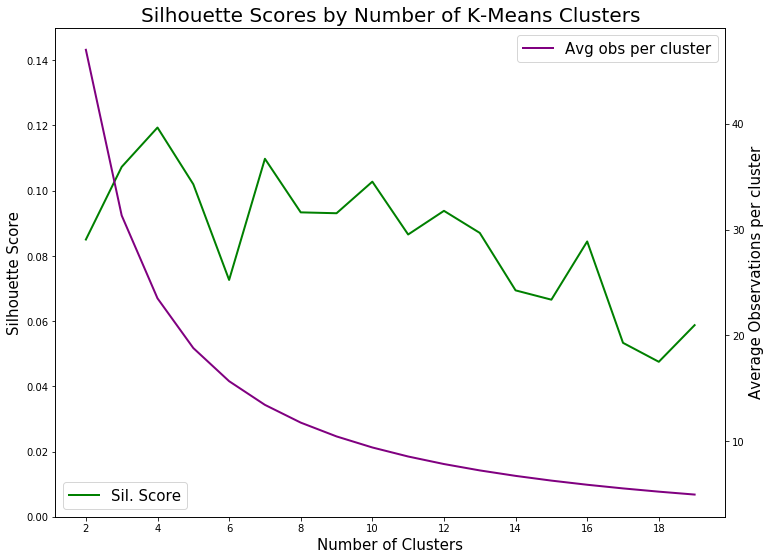

In [354]:
#Silhouette Scoreing is a decent proxy for knowing how
#many clusters to explore initially

fnclusts = list(range(2,20,1))
fsscores = [] 
avg_obs = []

for no in fnclusts:
    d2v_clusters = cluster.KMeans(n_clusters=no, random_state=r).fit_predict(vecs)    
    fsscores.append(silhouette_score(vecs, d2v_clusters, metric='cosine'))
    avg_obs.append(pd.value_counts(d2v_clusters).mean())


#Visualize Results
fig, ax = fig, ax = plt.subplots(figsize=(12,9))
ax2 = ax.twinx()
ax = sns.lineplot(fnclusts, fsscores,color='g', label='Sil. Score', linewidth=2, ax=ax)
ax2 =sns.lineplot(fnclusts, avg_obs,color='purple',label='Avg obs per cluster', linewidth=2)
ax.set_ylabel('Silhouette Score',fontsize=15)
ax.set_xlabel('Number of Clusters',fontsize=15)
ax.legend(loc='lower left',fontsize=15)
ax2.legend(loc='upper right',fontsize=15)
plt.ylabel('Average Observations per cluster',fontsize=15)
plt.title('Silhouette Scores by Number of K-Means Clusters',fontsize=20)
ax.set_ylim([0,.15])
ax.set_xticks([2,4,6,8,10,12,14,16,18])
plt.show()

In [0]:
#Lets use the largest 3 primary components to visualize these clusters
#Based on the above chart, let's start at 3 clusters:
pca = PCA(n_components=3)

#create dataframe for plotting, add components,labels
plot_data = pd.DataFrame()
plot_data['original'] = X_train
plot_data['contributor'] = y_train[:,0]
plot_data['filename'] = y_train[:,1]

#get cluster assignments from KMeans Clustering
d2v_kmclusters3 = cluster.KMeans(n_clusters=3, random_state=r).fit_predict(vecs)
plot_data['kmclusters3'] = d2v_kmclusters3

#fit transform doc2vec word vectors append to DF for plotting
Y = pca.fit_transform(vecs)
plot_data['PCA_1'] = Y[:,0]
plot_data['PCA_2'] = Y[:,1]
plot_data['PCA_3'] = Y[:,2]

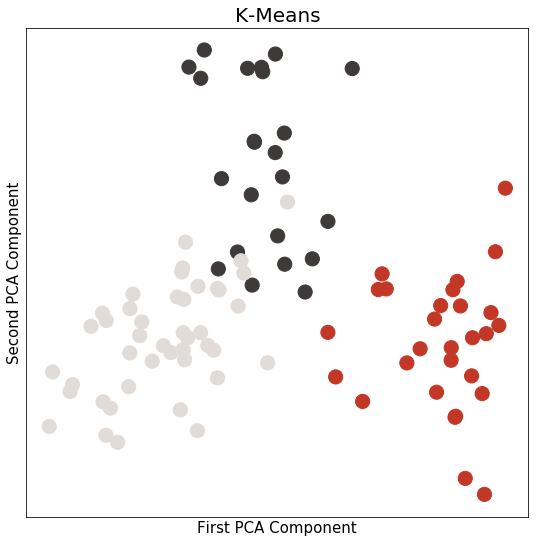

In [356]:
plt.figure(figsize=[9,9])
plt.title('K-Means', fontsize=20)
plt.scatter(plot_data.PCA_1,plot_data.PCA_2, 
            c=[colors[_] for _ in plot_data.kmclusters3], 
           s=200)
plt.xticks([])
plt.xlabel('First PCA Component', fontsize=15)
plt.yticks([])
plt.ylabel('Second PCA Component', fontsize=15)
plt.show()

In [0]:
#Function that will enable interactive plotly within Google colab
#https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [358]:
#Plot the first 3 PCA components in 3 dimensions
configure_plotly_browser_state()



# Configure the trace.
trace = go.Scatter3d(
    x=plot_data.PCA_1,
    y=plot_data.PCA_2,
    z=plot_data.PCA_3,
    mode='markers',
    marker={
        'size': 5,
        'color' : [colors[_] for _ in plot_data.kmclusters3],
        'opacity': 0.9,
    }
)

# Configure the layout.
layout = go.Layout(
    scene=dict(
     xaxis = dict(nticks=10, 
              tickfont=dict(color='white')
              ),
     yaxis = dict(nticks=10, 
              tickfont=dict(color='white')
              ),
     zaxis = dict(nticks=10, 
              tickfont=dict(color='white')
              )
    ),
    #margin={'l': 0, 'r': 0, 'b': 0, 't': 1},
)

data = [trace]
plot_figure = go.Figure(data=data, layout=layout)
plot_figure['layout']['title']['text'] = '3 Components, Clustered using Kmeans'
# Render the plot.
plotly.offline.iplot(plot_figure)

In [0]:
#This is a promising clustering method, let's examine the most 
#common words from each cluster:

#Function to plot wordcloud for a given series of lemmas:
def cluster_cloud(df, textcol, clustercol, n=25):
  for cluster in df[clustercol].unique():
    list = df[df[clustercol] == cluster][textcol]
    clustercorp = ' '.join(list)
    plt.figure(figsize=[15,10])
    plt.title('cluster '+str(cluster))
    wordcloud = WordCloud(background_color='#f6f6f6',
                         max_font_size=50, max_words=n).generate(clustercorp)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

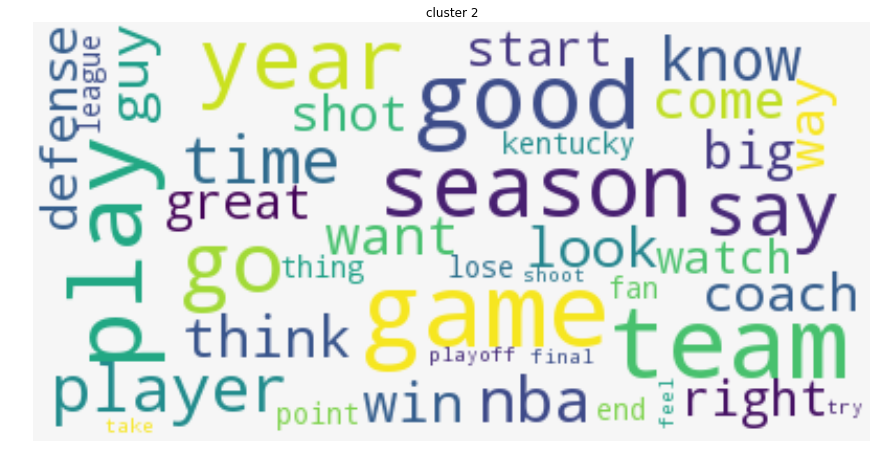

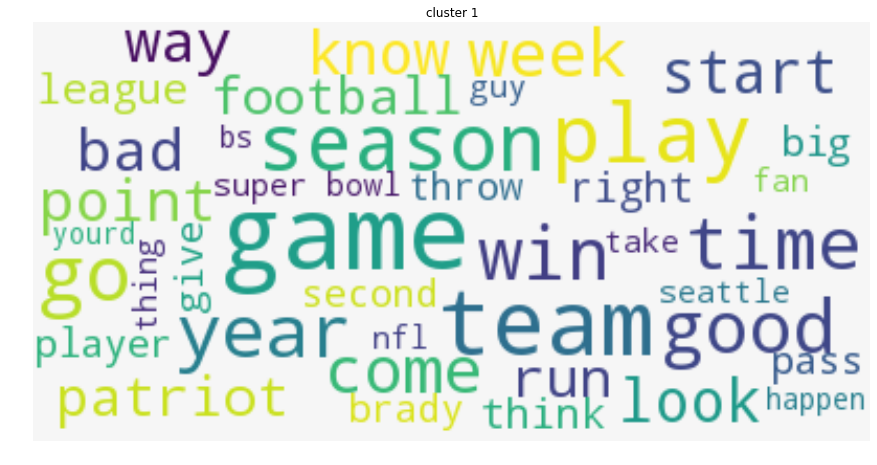

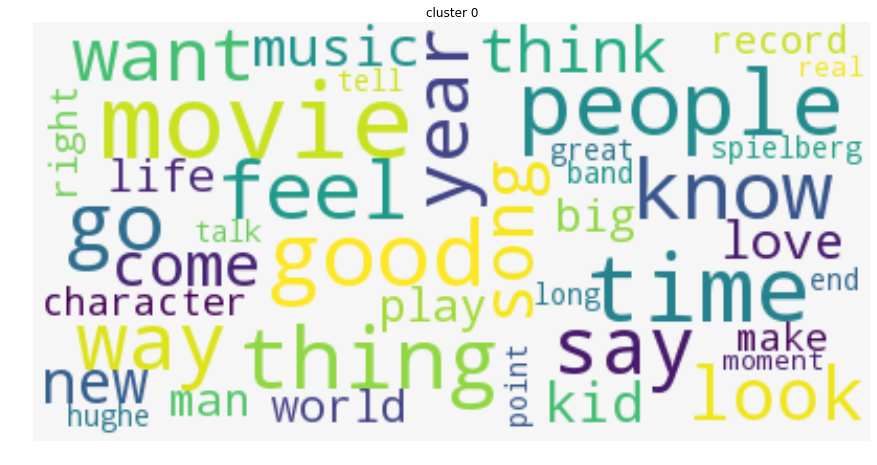

In [360]:
wc = cluster_cloud(plot_data, 'original', 'kmclusters3', n=40)

In [361]:
#We have separated basketball, football, and pop culture topics!
#Let's save this clustering method for the test data:
km3 = cluster.KMeans(n_clusters=3, random_state=r)
km3.fit(vecs)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=5, tol=0.0001, verbose=0)

#Spectral Clustering

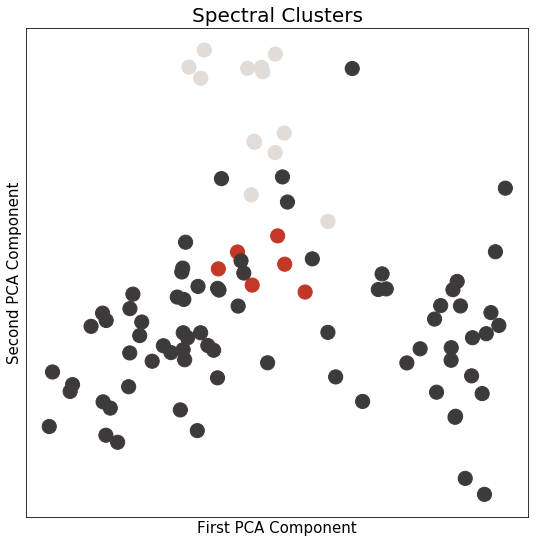

In [362]:
sc = cluster.SpectralClustering(n_clusters=3,
                               affinity='nearest_neighbors',
                               n_neighbors=5)
d2v_spclusters3 = sc.fit_predict(vecs)
sc.fit(vecs)
plot_data['sclusters3'] = d2v_spclusters3

plt.figure(figsize=[9,9])
plt.title('Spectral Clusters', fontsize=20)
plt.scatter(plot_data.PCA_1,plot_data.PCA_2, 
            c=[colors[_] for _ in plot_data.sclusters3], 
           s=200)
plt.xticks([])
plt.xlabel('First PCA Component', fontsize=15)
plt.yticks([])
plt.ylabel('Second PCA Component', fontsize=15)
plt.show()

In [363]:
#3D Plot
configure_plotly_browser_state()
# Configure the trace.
trace_s = go.Scatter3d(
    x=plot_data.PCA_1,
    y=plot_data.PCA_2,
    z=plot_data.PCA_3,
    mode='markers',
    marker={
        'size': 5,
        'color' : [colors[_] for _ in plot_data.sclusters3],
        'opacity': 0.9,
    }
)
data = [trace_s]
plot_figure = go.Figure(data=data, layout=layout)
plot_figure['layout']['title']['text'] = '3 Components, Spectral Clustering'
# Render the plot.
plotly.offline.iplot(plot_figure)

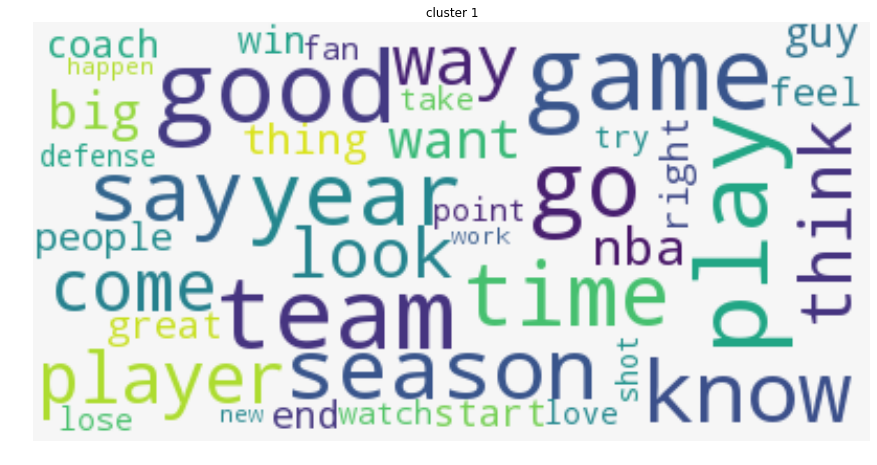

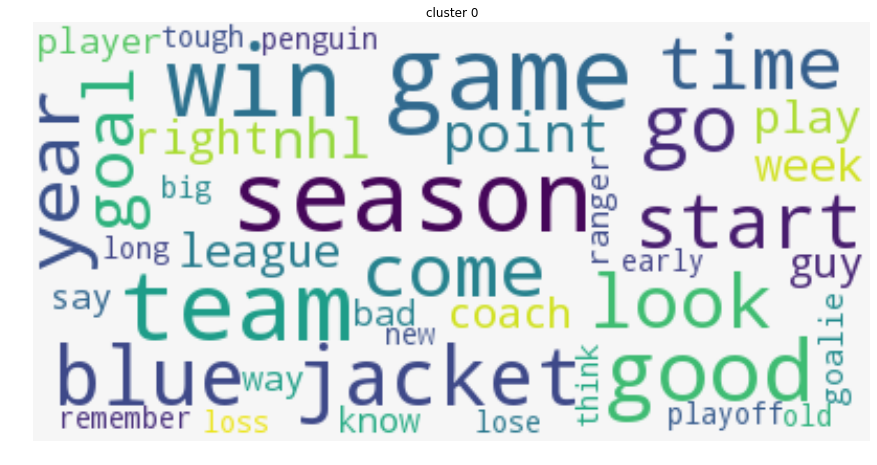

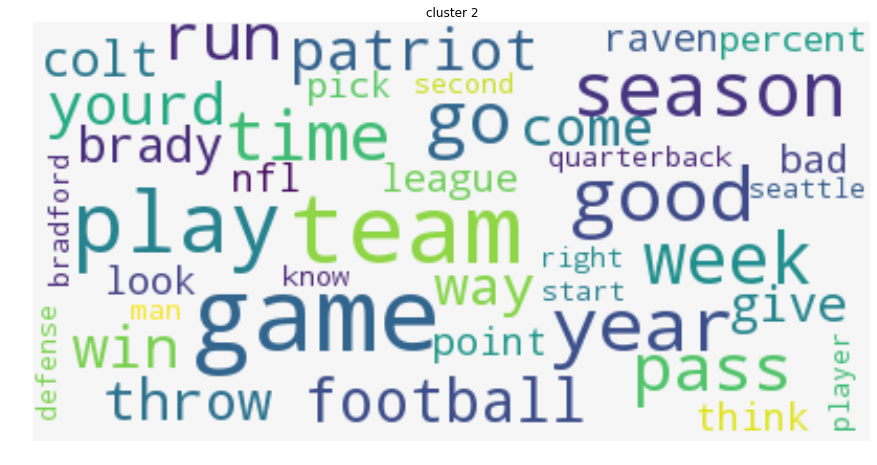

In [364]:
cluster_cloud(plot_data, 'original', 'sclusters3', n=40)

Interestingly, this captured basketball, football, and hockey. This implies 3 is not the right # of clusters, as Spectral failed to capture anything about the pop culture cluster K-Means found, and K-means didn't capture anything about hockey.  We need more clusters.

We'll explore Mean-Shift and Affinity Propagation.


In [365]:
#Meanshift for flexibility:
bandwidth = cluster.estimate_bandwidth(vecs, quantile=0.1)
ms = cluster.MeanShift(bandwidth=bandwidth, cluster_all=True)

d2v_msclusters = ms.fit_predict(vecs)
ms.fit(vecs)
plot_data['msclusters'] = d2v_msclusters

print('Created {} clusters'.format(len(set(d2v_msclusters))))

Created 5 clusters


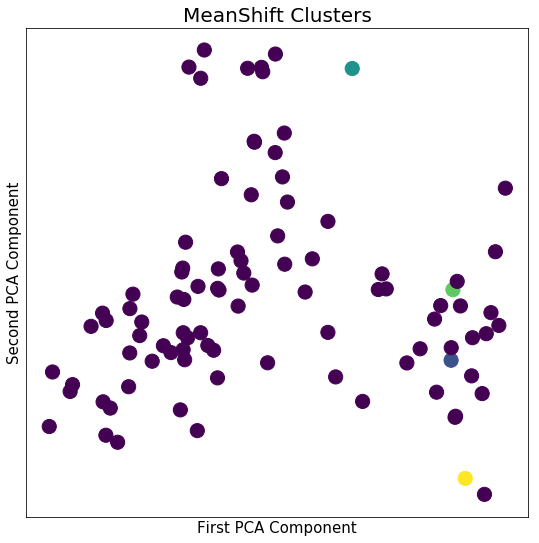

In [366]:
#This fails. Some topic - probably basketball - dominates all other clusters
plt.figure(figsize=[9,9])
plt.title('MeanShift Clusters', fontsize=20)
plt.scatter(plot_data.PCA_1,plot_data.PCA_2, c=plot_data.msclusters,
            #c=[colors[_] for _ in plot_data.msclusters], 
           s=200)
plt.xticks([])
plt.xlabel('First PCA Component', fontsize=15)
plt.yticks([])
plt.ylabel('Second PCA Component', fontsize=15)
plt.show()

In [0]:
#MeansShift was not effective, let's try Affinity Propagation

In [368]:
af = cluster.AffinityPropagation(damping=.92).fit(vecs)
print('Done')
d2v_afcluster = af.predict(vecs)
# Pull the number of clusters and cluster assignments for each data point.
cluster_centers_indices = af.cluster_centers_indices_
n_clusters_ = len(cluster_centers_indices)
print('Estimated number of clusters: {}'.format(n_clusters_))

Done
Estimated number of clusters: 11


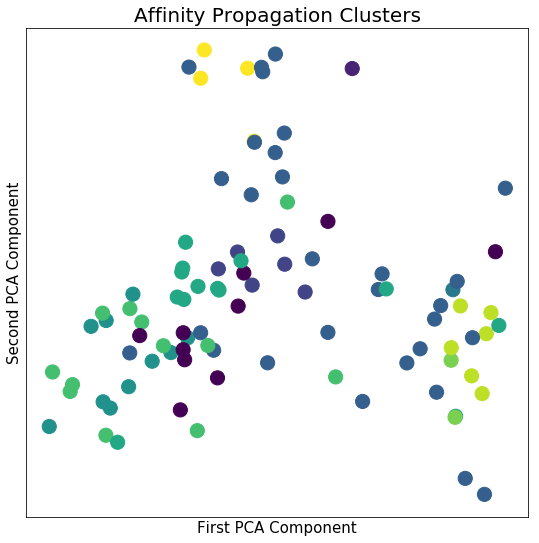

In [369]:
plt.figure(figsize=[9,9])
plt.title('Affinity Propagation Clusters', fontsize=20)
plt.scatter(plot_data.PCA_1,plot_data.PCA_2, c=d2v_afcluster,
            #c=[colors[_] for _ in plot_data.msclusters], 
           s=200)
plt.xticks([])
plt.xlabel('First PCA Component', fontsize=15)
plt.yticks([])
plt.ylabel('Second PCA Component', fontsize=15)
plt.show()

In [370]:

print('Kmeans Silhouette Score 3 clusters:', 
      silhouette_score(vecs, d2v_kmclusters3, metric='cosine'))

print('Spectral Silhouette Score 3 clusters:', 
      silhouette_score(vecs, d2v_spclusters3, metric='cosine'))

print('Meanshift Silhouette Score 5 clusters:', 
      silhouette_score(vecs, d2v_msclusters, metric='cosine'))

print('Affinity Propagation Silhouette Score 11 clusters:', 
      silhouette_score(vecs, d2v_afcluster, metric='cosine'))



Kmeans Silhouette Score 3 clusters: 0.10728289985611957
Spectral Silhouette Score 3 clusters: 0.05029620032879792
Meanshift Silhouette Score 5 clusters: -0.0840750380585639
Affinity Propagation Silhouette Score 11 clusters: 0.018391842503492132


K-Means appears best, but Affinity Propagation tends to overestimate how many clusters are needed and that could explain the poor score. Let's look qualitatively at these 11 clusters:

In [371]:
plot_data['afCluster'] = d2v_afcluster
wc={}
for icluster in plot_data['afCluster'].unique():
  aflist = plot_data[plot_data['afCluster'] == icluster]['original']
  clustercorp = ' '.join(aflist)
  wc[icluster] = Counter(clustercorp.split(' ')).most_common(15)
display(wc)

{0: [('say', 263),
  ('play', 196),
  ('game', 196),
  ('player', 130),
  ('smith', 126),
  ('go', 124),
  ('barne', 124),
  ('like', 118),
  ('millsap', 112),
  ('year', 110),
  ('season', 110),
  ('austin', 110),
  ('time', 102),
  ('good', 100),
  ('think', 99)],
 1: [('american', 22),
  ('football', 20),
  ('game', 18),
  ('sport', 15),
  ('child', 11),
  ('kill', 9),
  ('die', 9),
  ('evan', 8),
  ('school', 8),
  ('play', 8),
  ('high', 7),
  ('hit', 7),
  ('death', 7),
  ('murray', 6),
  ('get', 6)],
 2: [('season', 92),
  ('game', 89),
  ('team', 86),
  ('win', 80),
  ('blue', 69),
  ('good', 68),
  ('jacket', 63),
  ('0', 58),
  ('like', 54),
  ('go', 53),
  ('goal', 52),
  ('start', 51),
  ('look', 49),
  ('time', 48),
  ('come', 47)],
 3: [('like', 314),
  ('game', 312),
  ('time', 209),
  ('good', 203),
  ('go', 202),
  ('play', 201),
  ('team', 188),
  ('know', 173),
  ('year', 171),
  ('be', 153),
  ('way', 149),
  ('get', 144),
  ('win', 142),
  ('thing', 137),
  ('bs', 

In [0]:
#Some of these can be merged.
#These are manual assignments based on viewing the wc dictionary above
#If you rerun this notebook with any differences, including a 
#newly trained doc2vec model, these will not make sense as-is
af_to_real = {
    0: 'basketball',
    1: 'football',
    2: 'hockey',
    3: 'basketball',
    4: 'future',
    5: 'basketball',
    6: 'basketball',
    7: 'basketball',
    8: 'music',
    9: 'cinema',
    10: 'football'
}
plot_data['af_clusters'] = plot_data['afCluster'].map(af_to_real)

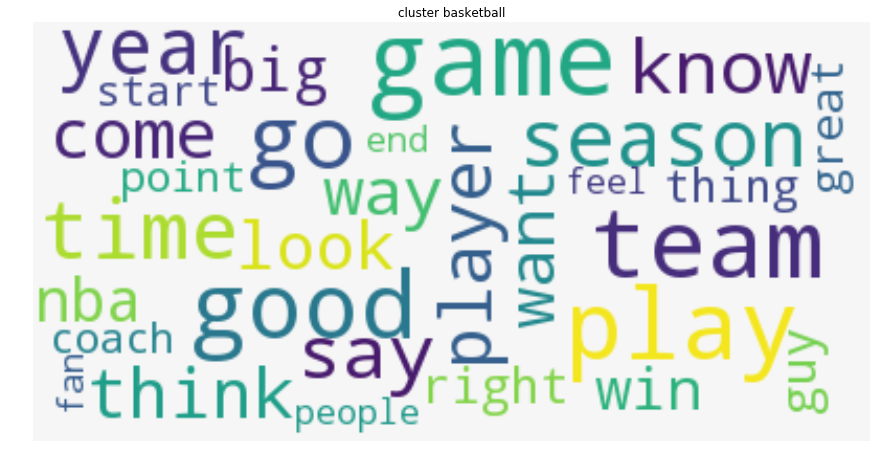

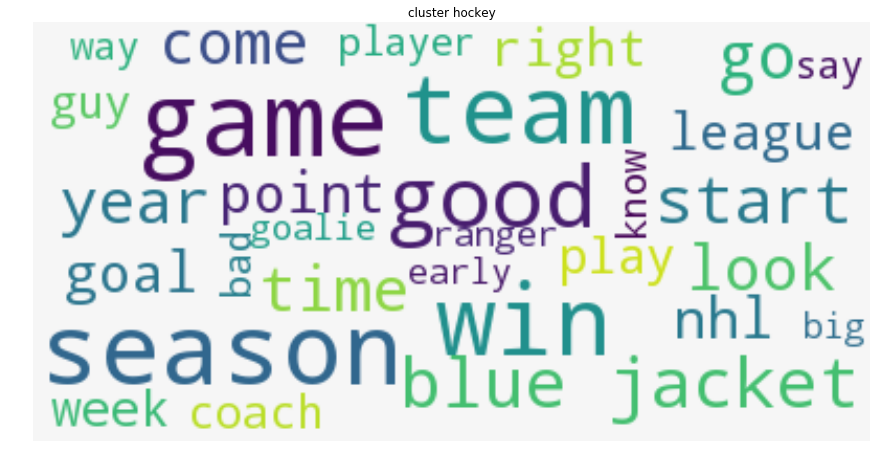

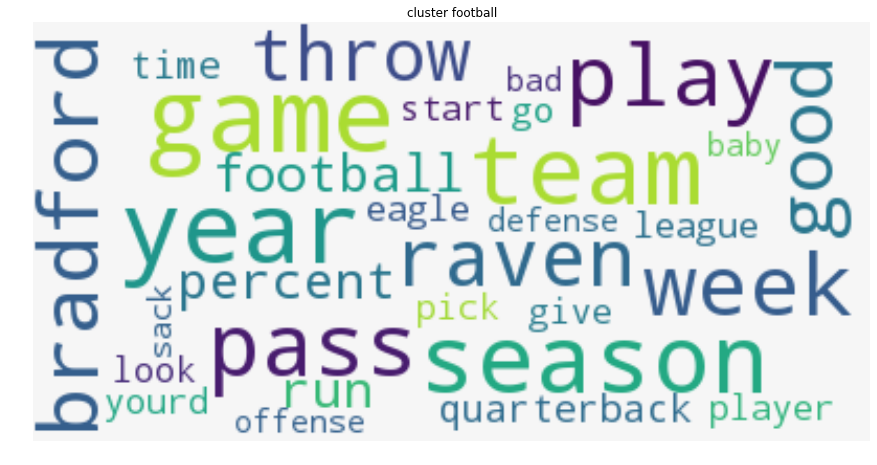

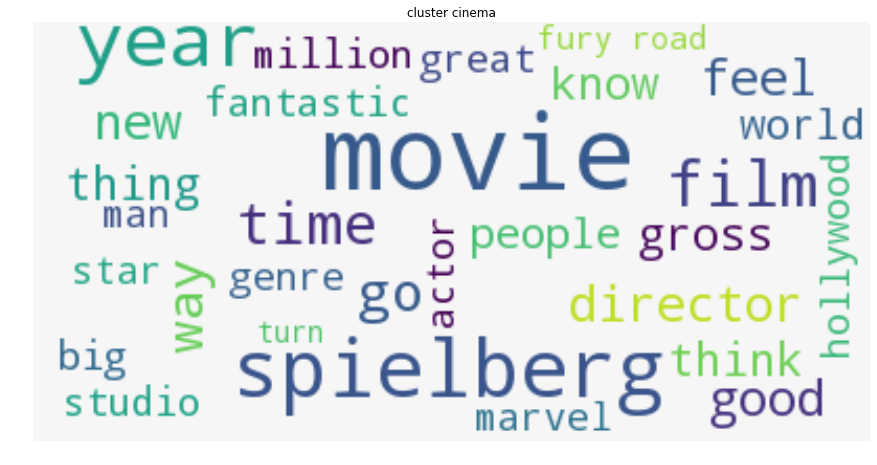

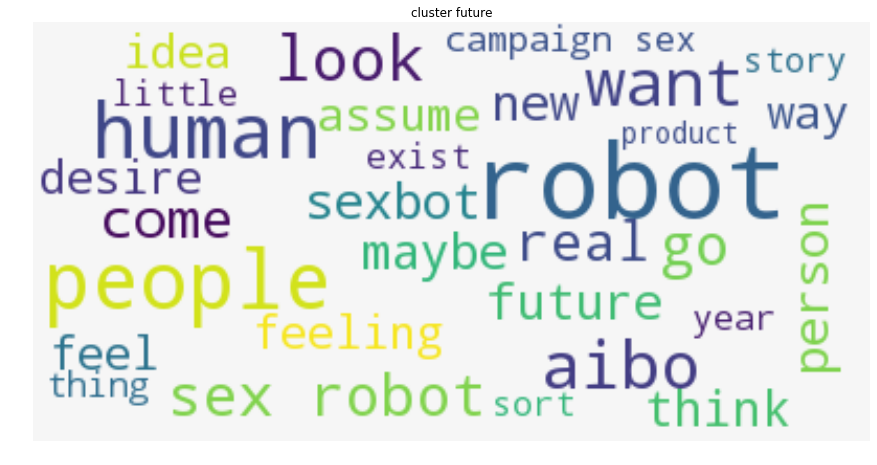

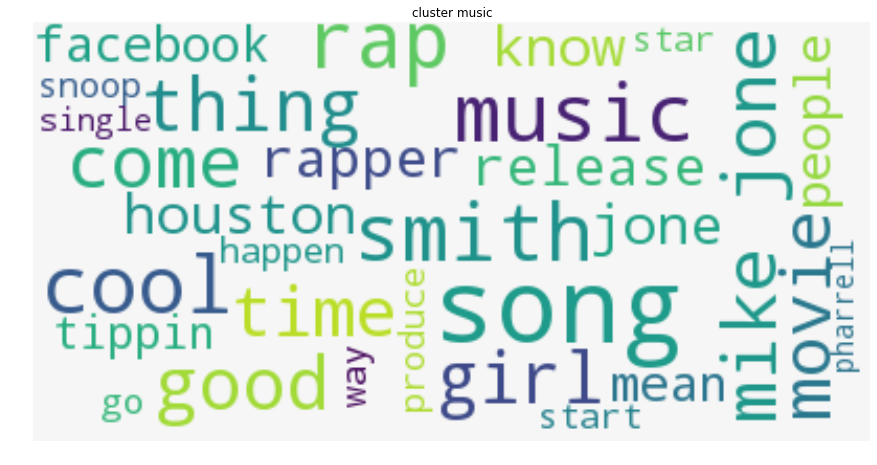

In [373]:
#These should be the final clusters:
cluster_cloud(plot_data, 'original', 'af_clusters', n=30)

In [0]:
#In spite of a poor silhouette score, these are now very meaningful clusters!

###Clustering Test Data to verify consistency

In [375]:
#Note that gensim's doc2vec silently ignores any vocabulary in test data that is
#not present in the training set, so these results must be viewed cautiously

#Doc2Vec needs a list of string tokens to infer a vector from a pretrained model:
X_test_l = [x.split(' ') for x in X_test]
# #Check top ten for cleaning issues:
# [Counter(_).most_common(5) for _ in X_test_l]
#Infer vectors of test data from pretrained model
testvecs = pd.DataFrame([model.infer_vector(x) for x in X_test_l])
testvecs.shape

(32, 65)

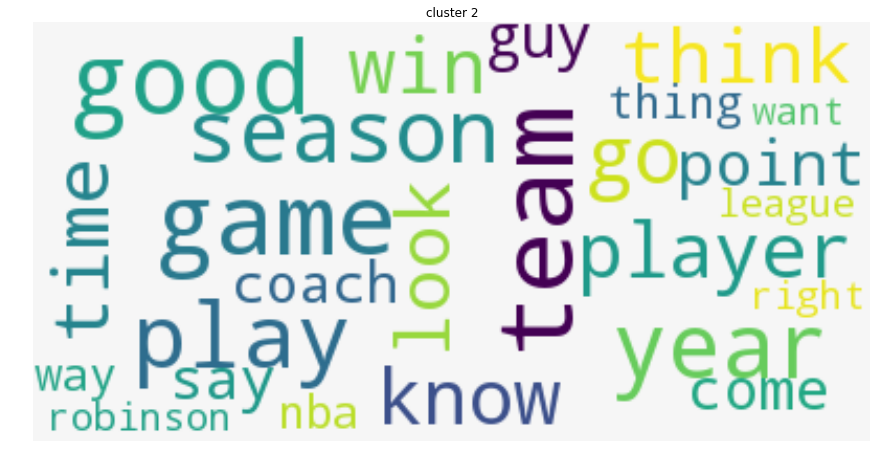

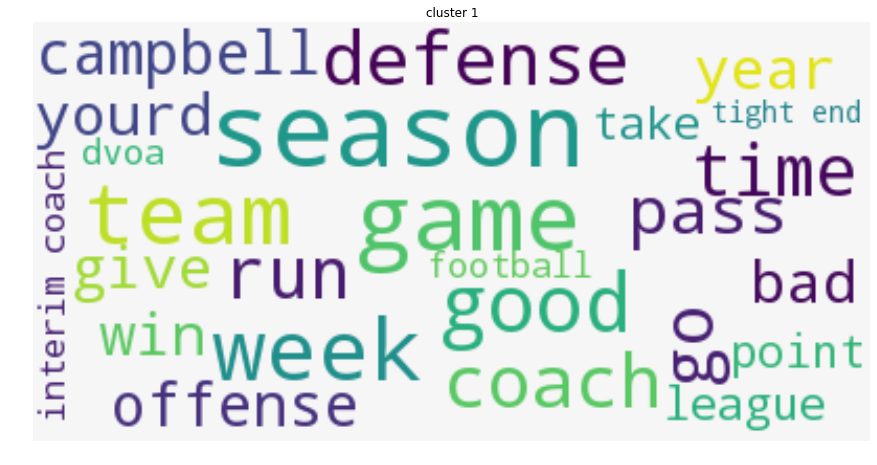

In [376]:
#get cluster assignments from KMeans Clustering
test_data = pd.DataFrame()
test_data['original'] = X_test
test_data['contributor'] = y_test[:,0]
test_data['test_kmclusters3'] = km3.predict(testvecs)
cluster_cloud(test_data, 'original', 'test_kmclusters3')

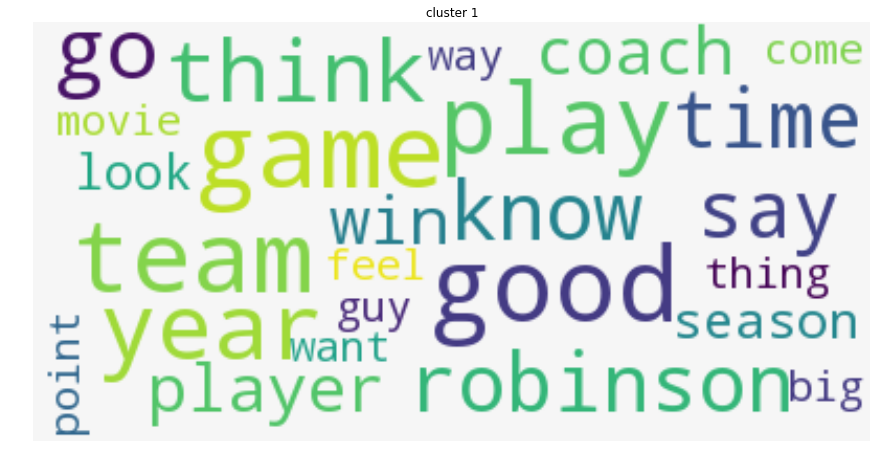

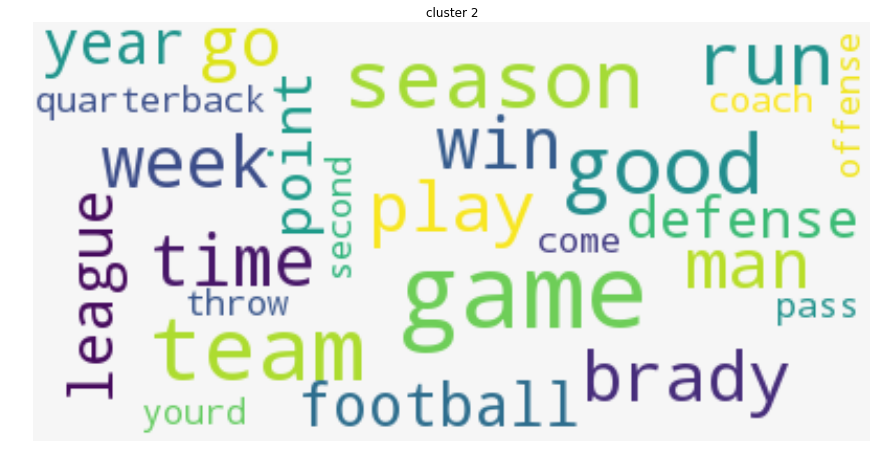

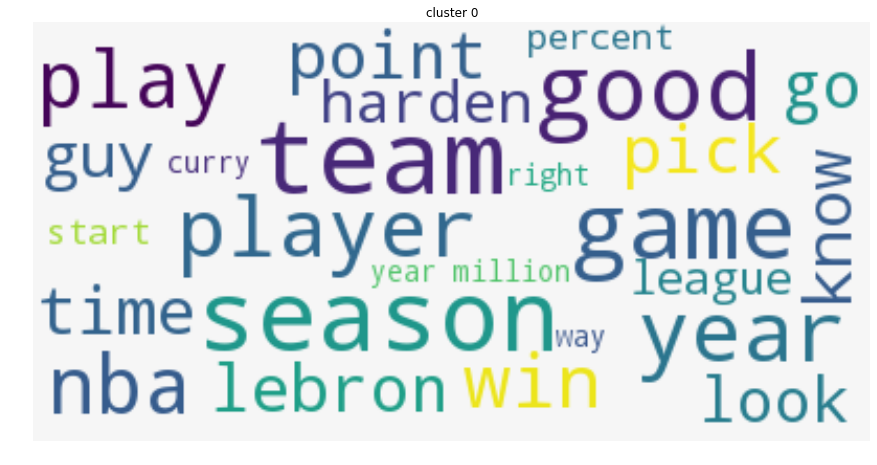

In [377]:
test_data['test_sclusters3'] = sc.fit_predict(testvecs)
cluster_cloud(test_data, 'original', 'test_sclusters3')

The test data does not conform to the same clusters as well, but that could be a sparse data issue as the test data is only 34 articles. It's not surprising to see a datset with a class imbalance problem (i.e., lots of basketball articles) return unstable results on  sparse data.

In [378]:
#A contingency table shows which contributor's articles are being
#attributed to each topic
pd.crosstab(index=plot_data.contributor, columns=plot_data.af_clusters)

af_clusters,basketball,cinema,football,future,hockey,music
contributor,,,,,,
andrewsharp,9,0,0,0,0,0
billbarnwell,2,0,4,0,0,0
billsimmons,8,0,0,0,0,0
brianphillips,7,0,0,1,0,0
charlesppierce,5,0,1,0,0,0
jonathanabrams,9,0,0,0,0,0
kirkgoldsberry,6,0,0,0,0,0
markharris,2,5,0,0,0,0
marktitus,8,0,0,0,0,0


#Challenge: Can we predict the contributor of each article?
###2 feature creation methods:


1.   Latent Semantic Analysis
2.   Doc2vec vectors for each article (created above)



##Latent Semantic Analysis

In [379]:
#Create article vectors via LSA
vectorizer = TfidfVectorizer(max_df=.6, min_df=10, norm=u'l2',
                             stop_words=nlp.Defaults.stop_words)
vectorizer.fit(X_train)
train_tfidf = vectorizer.transform(X_train)
test_tfidf = vectorizer.transform(X_test)
print("Number of features: %d" % train_tfidf.get_shape()[1])

Number of features: 1425


In [380]:
svd= TruncatedSVD(50)
lsa = make_pipeline(svd, Normalizer(copy=False))
lsa.fit(train_tfidf)
lsa_train = lsa.transform(train_tfidf)
lsa_test = lsa.transform(test_tfidf)
svd.explained_variance_ratio_.sum()

0.7508319009264647

###Random Forest, LSA features

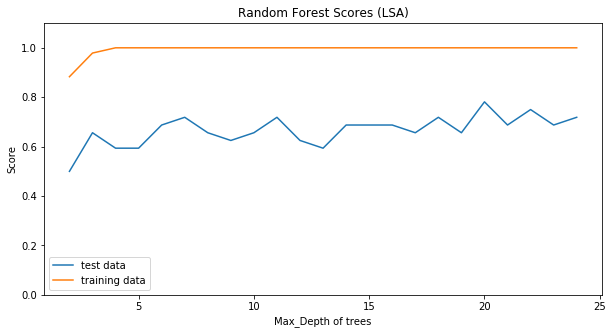

In [381]:
#Random Forest
tests = []
trains = []
for i in range(2,25,1):
  rfc_lsa = ensemble.RandomForestClassifier(n_estimators=50,
                                     max_depth=i)
  rfc_lsa.fit(lsa_train, y_train[:,0])
  trains.append(rfc_lsa.score(lsa_train, y_train[:,0]))
  tests.append(rfc_lsa.score(lsa_test, y_test[:,0]))
plt.figure(figsize=[10,5])
plt.title('Random Forest Scores (LSA)')
plt.plot(range(2,25,1), tests, label='test data')
plt.plot(range(2,25,1), trains, label = 'training data')
plt.xlabel('Max_Depth of trees')
plt.ylabel('Score')
plt.legend()
plt.ylim([0,1.1])
plt.show()

In [382]:
rfc_lsa = ensemble.RandomForestClassifier(n_estimators=50,
                                     max_depth=5)
rfc_lsa.fit(lsa_train, y_train[:,0])
print("RFC on LSA F1 score: ", 
      f1_score(y_test[:,0], rfc_lsa.predict(lsa_test), average='micro'))

RFC on LSA F1 score:  0.65625


###Logistic Regression, LSA features

In [383]:
logr_lsa = linear_model.LogisticRegressionCV(solver='liblinear', 
                                         multi_class='auto' , cv=5)
logr_lsa.fit(lsa_train, y_train[:,0])
print("Logistic Regression on LSA F1 score: ", 
      f1_score(y_test[:,0], logr_lsa.predict(lsa_test), average='micro'))

Logistic Regression on LSA F1 score:  0.75


###KNN, LSA features

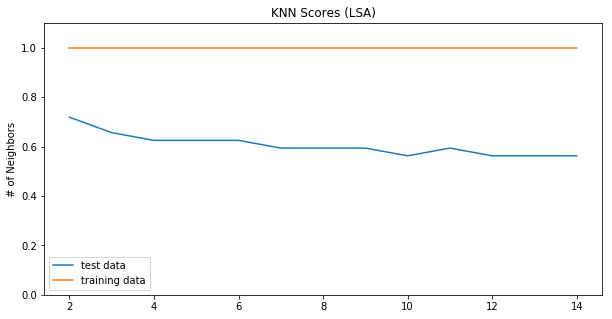

In [384]:
knn_lsa = neighbors.KNeighborsClassifier(n_neighbors=5, weights='distance')

tests = []
trains = []
for i in range(2,15,1):
  knn_lsa = neighbors.KNeighborsClassifier(n_neighbors=i, weights='distance')
  knn_lsa.fit(lsa_train, y_train[:,0])
  trains.append(knn_lsa.score(lsa_train, y_train[:,0]))
  tests.append(knn_lsa.score(lsa_test, y_test[:,0]))
plt.figure(figsize=[10,5])
plt.title('KNN Scores (LSA)')
plt.plot(range(2,15,1),tests, label='test data')
plt.plot(range(2,15,1), trains, label = 'training data')
plt.plot()
plt.ylabel('# of Neighbors')
plt.legend()
plt.ylim([0,1.1])
plt.show()

In [385]:
knn_lsa = neighbors.KNeighborsClassifier(n_neighbors=2, weights='distance')

knn_lsa.fit(lsa_train, y_train[:,0])
print("KNN on LSA F1 score: ", 
      f1_score(y_test[:,0], knn_lsa.predict(lsa_test), average='micro'))

KNN on LSA F1 score:  0.71875


Logistic Regression appears best for the LSA features. We'll examine the output alongside the output 
of the other featureset later on.

##Classification using doc2vec vectors as features



###Random Forest, d2v features

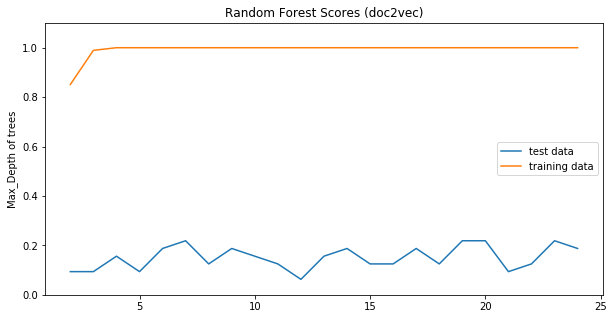

In [386]:
tests = []
trains = []
for i in range(2,25,1):
  rfc_d2v = ensemble.RandomForestClassifier(n_estimators=50,
                                     max_depth=i)
  rfc_d2v.fit(vecs, y_train[:,0])
  trains.append(rfc_d2v.score(vecs, y_train[:,0]))
  tests.append(rfc_d2v.score(testvecs, y_test[:,0]))
plt.figure(figsize=[10,5])
plt.title('Random Forest Scores (doc2vec)')
plt.plot(range(2,25,1), tests, label='test data')
plt.plot(range(2,25,1), trains, label = 'training data')
plt.ylabel('Max_Depth of trees')
plt.legend()
plt.ylim([0,1.1])
plt.show()

In [387]:
rfc_d2v = ensemble.RandomForestClassifier(n_estimators=50,
                                     max_depth=12)
rfc_d2v.fit(vecs, y_train[:,0])
print("RFC on d2v F1 score: ", 
      f1_score(y_test[:,0], rfc_d2v.predict(testvecs), average='micro'))

RFC on d2v F1 score:  0.1875


###Logistic Regression, d2v features

In [388]:
logr_d2v = linear_model.LogisticRegressionCV(solver='liblinear', 
                                         multi_class='auto' , cv=5)
logr_d2v.fit(vecs, y_train[:,0])
print("Logistic Regression on d2v F1 score: ", 
      f1_score(y_test[:,0], logr_d2v.predict(testvecs), average='micro'))

Logistic Regression on d2v F1 score:  0.46875


###KNN, d2v features

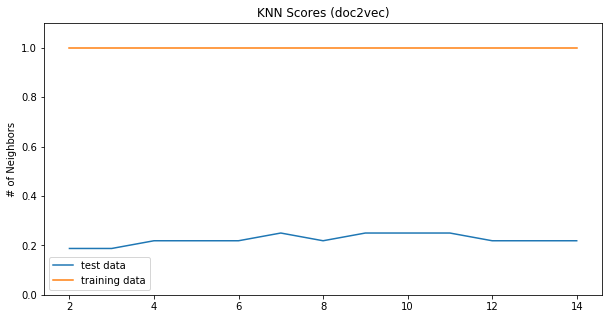

In [389]:
knn_d2v = neighbors.KNeighborsClassifier(n_neighbors=5, weights='distance')

tests = []
trains = []
for i in range(2,15,1):
  knn_d2v = neighbors.KNeighborsClassifier(n_neighbors=i, weights='distance')
  knn_d2v.fit(vecs, y_train[:,0])
  trains.append(knn_d2v.score(vecs, y_train[:,0]))
  tests.append(knn_d2v.score(testvecs, y_test[:,0]))
plt.figure(figsize=[10,5])
plt.title('KNN Scores (doc2vec)')
plt.plot(range(2,15,1), tests, label='test data')
plt.plot(range(2,15,1), trains, label = 'training data')
plt.ylabel('# of Neighbors')
plt.legend()
plt.ylim([0,1.1])
plt.show()

In [390]:
knn_d2v = neighbors.KNeighborsClassifier(n_neighbors=11, weights='distance')
knn_d2v.fit(vecs, y_train[:,0])
print("KNN on d2v F1 score: ", 
      f1_score(y_test[:,0], knn_d2v.predict(testvecs), average='micro'))

KNN on d2v F1 score:  0.25


###Confusion Matrix for best model

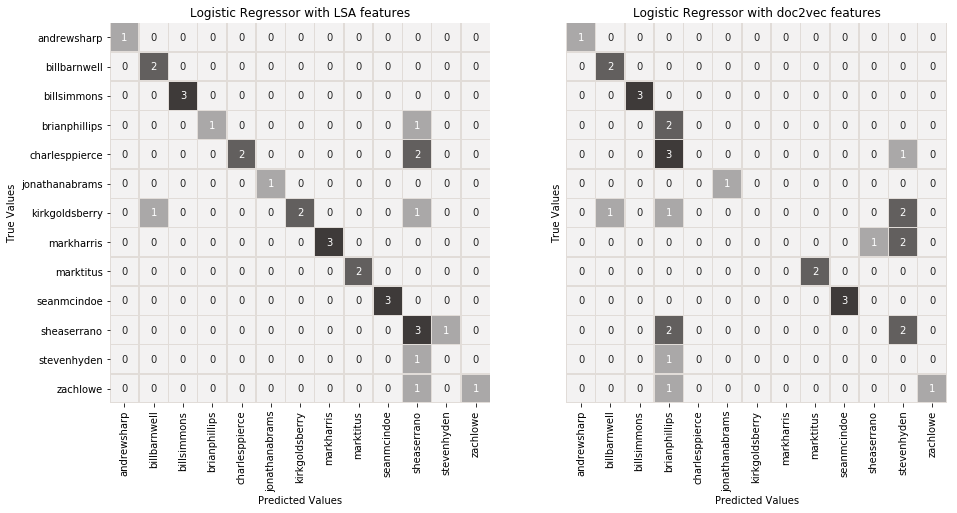

In [391]:
#Examine the output of our best model (CV training data):

fig = plt.figure(figsize=[15,7])


fig.add_subplot(121)
cm = confusion_matrix(y_test[:,0],logr_lsa.predict(lsa_test))
testlabels = list(set(y_test[:,0]))
testlabels = sorted(testlabels)
cmap =sns.light_palette(colors[1])
sns.heatmap(cm, annot=True, linewidths=.5,cmap=cmap, cbar=False,
           xticklabels=testlabels, yticklabels=testlabels, linecolor=colors[2])
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.title('Logistic Regressor with LSA features')

fig.add_subplot(122)
cm = confusion_matrix(y_test[:,0],logr_d2v.predict(testvecs))
testlabels = list(set(y_test[:,0]))
testlabels = sorted(testlabels)
cmap =sns.light_palette(colors[1])
sns.heatmap(cm, annot=True, linewidths=.5,cmap=cmap, cbar=False,
           xticklabels=testlabels, yticklabels=False, linecolor=colors[2])
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.title('Logistic Regressor with doc2vec features')
plt.show()

#Most common and most unique lemmas by Contributor

In [0]:
#List of contributor names
contributors = set(df.contributor) 

#Store 200 most common lemmas by each contributor
cont_top200 = {}
for cont in contributors:
  #List of contributor's articles
  contlist = df[df.contributor==cont]['lemma_text']
  #String version of the same
  contlemmas = ' '.join(contlist)
  #reduce to just top 200
  cont200 = [x[0] for x in Counter(contlemmas.split(' ')).most_common(200)]
  #Store to dict
  cont_top200[cont] = cont200

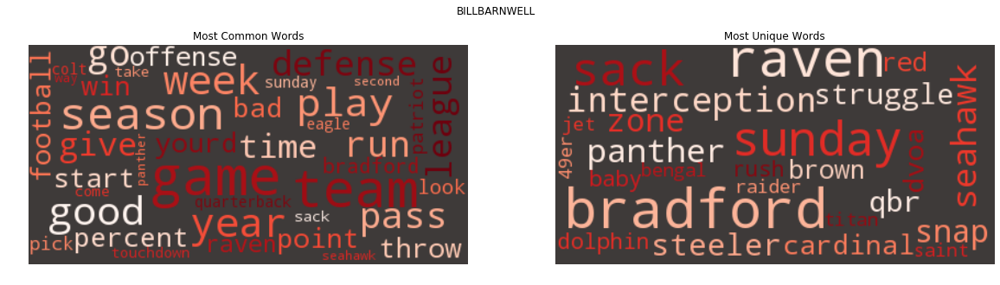

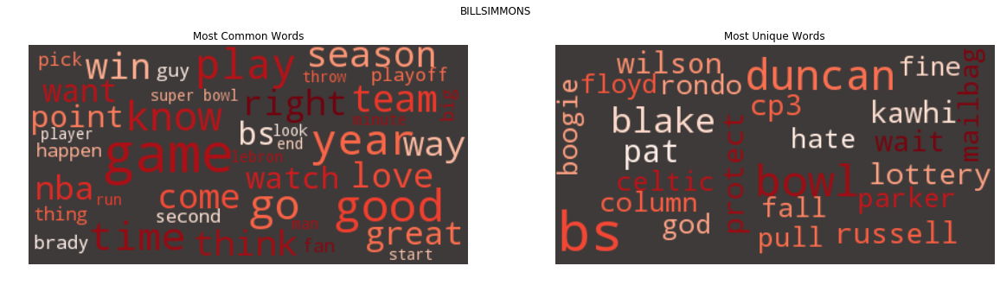

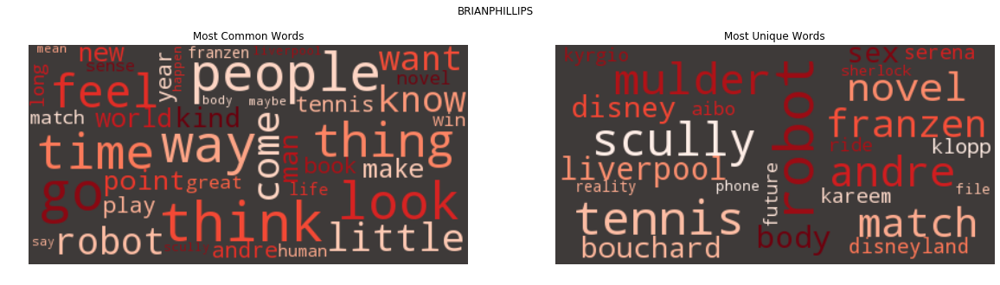

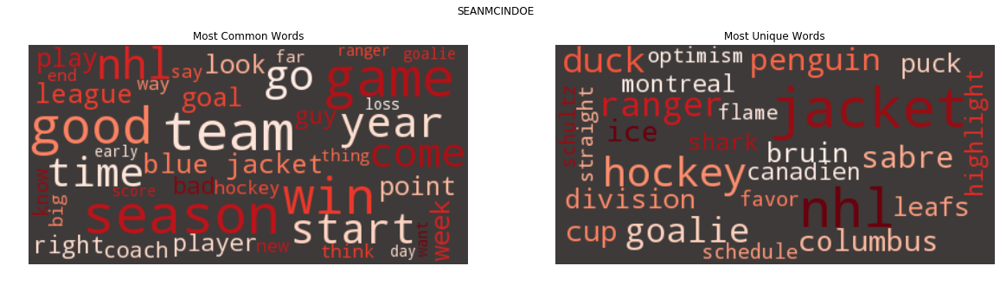

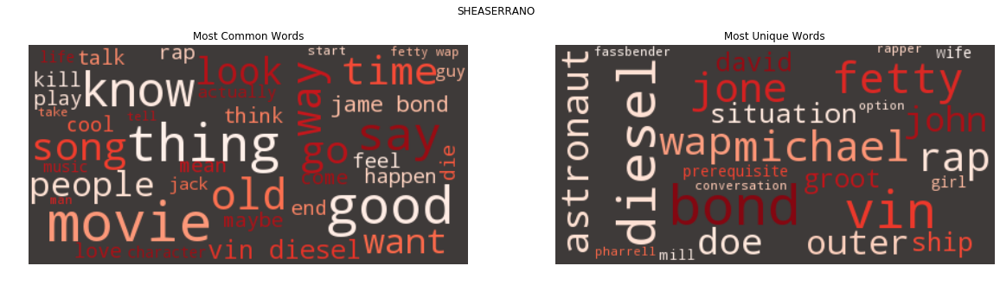

...

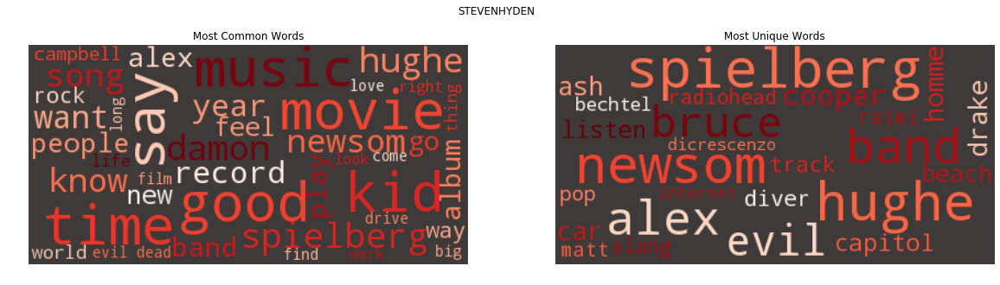

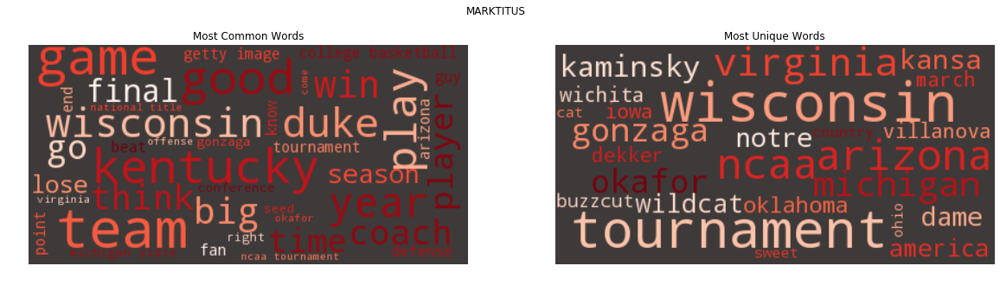

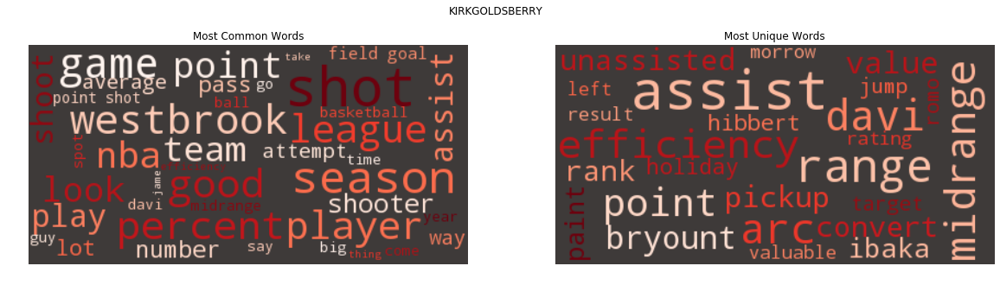

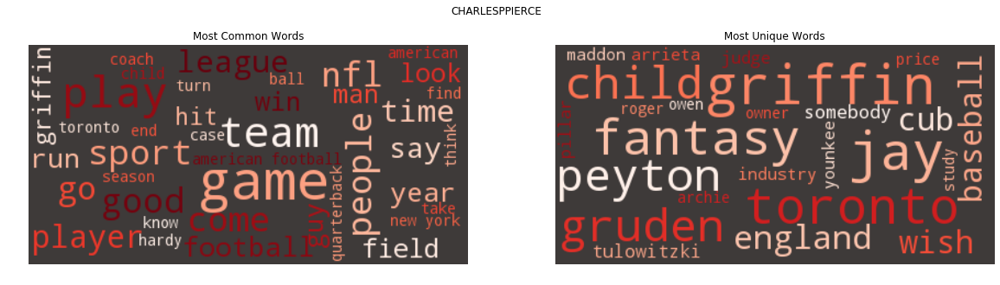

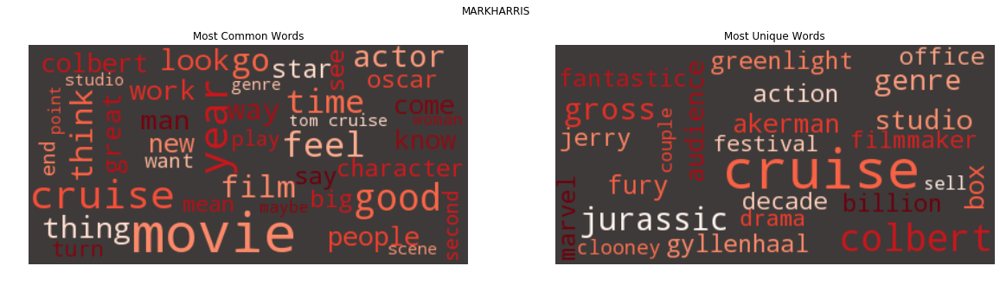

In [393]:
#This loop creates a wordcloud from each contributor's most commonly used words.
#It also compares each contributor's top 200 words to the rest, 
#and creates a word cloud from the difference as a way of targeting
#unique words used.
for name, words in cont_top200.items():
  #List to store all other contributor's words for comparison
  others = []
  for other, othtop200 in  cont_top200.items():
    if name == other:
      pass 
    else:
      others.append(othtop200)
  #others is now a list, 12 len, each item is a 200 len list of words
  #i.e. it's the most common 200 words for each of the "other" 12 contributors
  #flatten the list:
  others = [item for sublist in others for item in sublist]
  
  #Find uniques for the contributor
  contuniques = list(set(words) - set(others))
  
  #Store the original lemmas as a list/string,
  #which we'll need for quanitities
  contlist = df[df.contributor==name]['lemma_text']
  contlemmas = ' '.join(contlist)
  contlist = contlemmas.split(' ')
  
  #make a list of the contributors unique words,
  #with quantity representation, then flatten it
  qtylist = []
  for i in contuniques:
    qtylist.append([i]*contlist.count(i))
  qtylist = [item for sublist in qtylist for item in sublist]
  qtystr = ' '.join(qtylist)
  
  #Plot the wordclouds
  
  fig = plt.figure(figsize=[20,5])
  fig.suptitle(name.upper())
  
  #Most common words
  fig.add_subplot(121)
  plt.title('Most Common Words')

  wordcloud = WordCloud(background_color=colors[1],colormap='Reds',
                max_font_size=50, max_words=40).generate(contlemmas)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  
  #Most unique words
  fig.add_subplot(122)
  plt.title('Most Unique Words')
  wordcloud = WordCloud(background_color=colors[1], collocations=False,
                        colormap='Reds', max_font_size=50, 
                        max_words=25).generate(qtystr)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
   
  
  plt.show()
  

  
